<a href="https://colab.research.google.com/github/rootAkash/vision.ai/blob/master/ganART_CycleGan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Connect to gdrive to save the trained models

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


Download the horse to zebra dataset and unzip it. This is not stored in gdrive here but for bigger datasets its advised to download and store it in gdrive to avoid wasting time in downloads.

In [ ]:
!wget https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/horse2zebra.zip
!unzip horse2zebra.zip

--2021-05-16 08:04:09--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/horse2zebra.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.244.190
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 116867962 (111M) [application/zip]
Saving to: ‘horse2zebra.zip’

horse2zebra.zip     100%[===================>] 111.45M  1.80MB/s    in 46s     

2021-05-16 08:04:56 (2.40 MB/s) - ‘horse2zebra.zip’ saved [116867962/116867962]

Archive:  horse2zebra.zip
   creating: horse2zebra/
   creating: horse2zebra/trainA/
  inflating: horse2zebra/trainA/n02381460_6223.jpg  
  inflating: horse2zebra/trainA/n02381460_1567.jpg  
  inflating: horse2zebra/trainA/n02381460_3354.jpg  
  inflating: horse2zebra/trainA/n02381460_299.jpg  
  inflating: horse2zebra/trainA/n02381460_3001.jpg  
  inflating: horse2zebra/trainA/n02381460_4242.jpg  
  inflating: horse2zebra/train

Define the dataloader for loading data during training

In [ ]:
import os
import cv2
import torch
from PIL import Image
import numpy as np
from torch.utils.data import Dataset, DataLoader


class cycleganDataset(Dataset):

    def __init__(self, root_a_dir, root_b_dir, transform=None):
        """
        Args:
            root_a_dir(string): Path to the directory with all the images of class A.
            root_b_dir (string): Path to the directory with all the images of class A.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.root_a_dir = root_a_dir
        self.root_b_dir = root_b_dir
        self.transform = transform
        self.As = os.listdir(self.root_a_dir)
        self.Bs = os.listdir(self.root_b_dir)
        self.n_As = len(self.As)
        self.n_Bs = len(self.Bs)
        self.len_data = max(self.n_As,self.n_Bs)  

    def __len__(self):
        return self.len_data

    def __getitem__(self, idx):

        img_A_name = os.path.join(self.root_a_dir,self.As[idx%self.n_As])#since data is arbitrary length for each class we can just repeat 
        img_B_name = os.path.join(self.root_b_dir,self.Bs[idx%self.n_Bs])#since data is arbitrary length for each class we can just repeat 
        #print(img_A_name,img_B_name)
        imageA = np.array(Image.open(img_A_name).convert("RGB"))
        imageB = np.array(Image.open(img_B_name).convert("RGB"))
        if self.transform:
            pass
        #print(imageA.shape,imageB.shape)    
        imageA = np.moveaxis(imageA, 2, 0)/255.0 #make it 0-1
        imageB = np.moveaxis(imageB, 2, 0)/255.0 #make it 0-1   
        return (imageA-0.5)/0.5,(imageB-0.5)/0.5 #-1 to 1

An example of how to use dataloader 

In [ ]:
from google.colab.patches import cv2_imshow
from matplotlib.pyplot import imshow
from tqdm import tqdm

import time
dataset = cycleganDataset(root_a_dir="/content/horse2zebra/trainA/", root_b_dir="/content/horse2zebra/trainB", transform=None)
dataloader = DataLoader(dataset, batch_size=4,shuffle=True, num_workers=2,pin_memory=True)
#for i,(A,B) in enumerate(tqdm(dataloader)):
#  print(i,A.shape,B.shape)
    

Train function and other helper functions.

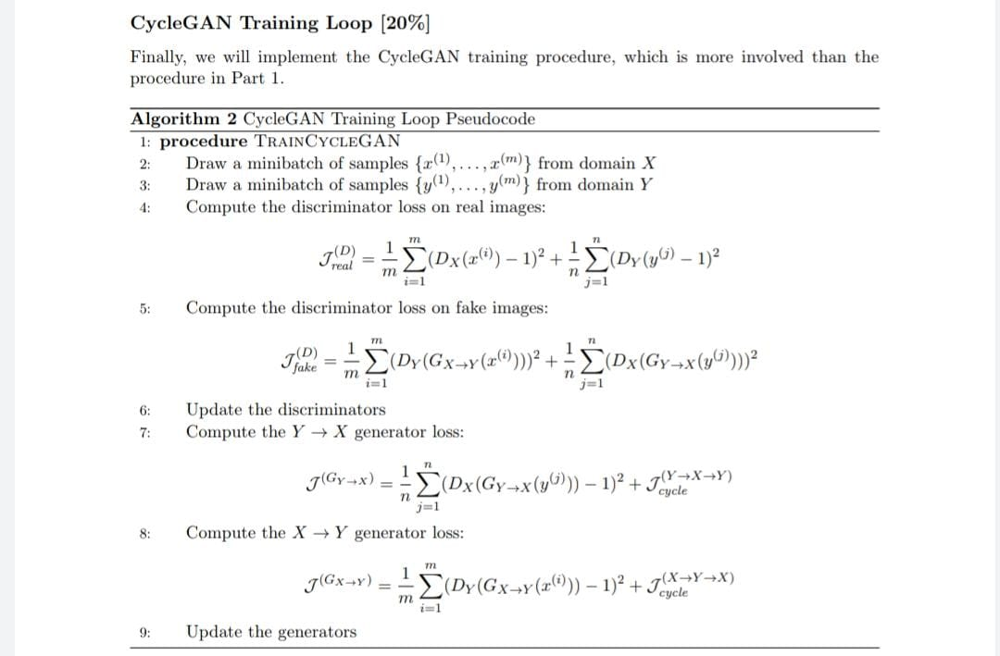

In [ ]:
def train(dataloader,genAB,genBA,disA,disB,genopt,disopt,path,epochs=20,identity_loss=False):
    step=0
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    L1 = nn.L1Loss() #for cycle loss
    mse = nn.MSELoss() # for disc loss
    cycle_coeff = 10
    id_coeff =1
    for e in range(epochs):

        for i,(A,B) in enumerate(tqdm(dataloader)) :
            step+=1
            real_A = A.float().to(device)
            real_B = B.float().to(device)
            fake_B = genAB(real_A)#use genAB to get fake B 
            fake_A = genBA(real_B)#use genBA to get back fake A 
            #first train discriminnators to learn difference between real and fake
            #then train generators to be as real as possible
            #then train generators to be cyclic consistant
            #then train them to be identity for indomain data
            #############################################################################################################################
            #train the discriminators in isolation                                                                                      #  
            disA_real_pred=disA(real_A) #push disc to predict 1                                                                         #      
            disA_fake_pred=disA(fake_A.detach()) #push disc to predict 0                                                                #  
            disA_loss = mse(disA_real_pred,torch.ones_like(disA_real_pred)) + mse(disA_fake_pred,torch.zeros_like(disA_fake_pred))      #
                                                                                                                                        #
            disB_real_pred=disB(real_B) #push disc to predict 1                                                                         #
            disB_fake_pred=disB(fake_B.detach()) #push disc to predict 0                                                                #    
            disB_loss = mse(disB_real_pred,torch.ones_like(disB_real_pred)) + mse(disB_fake_pred,torch.zeros_like(disB_fake_pred))      #
            dis_loss = (disA_loss + disB_loss)/2                                                                                        #  
            disopt.zero_grad()                                                                                                          #
            dis_loss.backward()                                                                                                         #    
            disopt.step()                                                                                                               #  
            #############################################################################################################################
            #generator training                                                                                                         #
            #adveserial loss for generator                                                                                              #      
            disA_fake_pred=disA(fake_A)                                                                                                 #
            disB_fake_pred=disB(fake_B)                                                                                                 #
            genABloss = mse(disB_fake_pred,torch.ones_like(disB_fake_pred))  #make genAB fool discB so that it outputs 1 for fake B     #
            #(since genopt is tied to only generater params it will train generators only )                                             #  
            genBAloss = mse(disA_fake_pred,torch.ones_like(disA_fake_pred))  #make genBA fool discA so that it outputs 1 for fake A     #
            #cyclic loss training                                                                                                       #
            cyclic_A = genBA(fake_B) #realA->genAB->fakeB->genBA->cyclicA                                                               #    
            cyclic_B = genAB(fake_A) #realB->genBA->fakeA->genAB->cyclicB                                                               #
            cyc_A_loss = L1(real_A,cyclic_A)                                                                                            #
            cyc_B_loss = L1(real_B,cyclic_B)                                                                                            #
            #identity loss                                                                                                              #
            if identity_loss:                                                                                                           #
              id_B=genAB(real_B) # realB->genAB->id_B(realB)                                                                            #
              id_A=genBA(real_A) # realA->genBA->id_A(realA)                                                                            #
              id_B_loss = L1(id_B,real_B)                                                                                               #
              id_A_loss = L1(id_A,real_A)                                                                                               #
            else:                                                                                                                       #
              id_B_loss = 0                                                                                                             #
              id_A_loss = 0                                                                                                             #
            gen_loss = genABloss+genBAloss + cycle_coeff*cyc_A_loss+cycle_coeff*cyc_B_loss + id_coeff*id_B_loss+id_coeff*id_A_loss      #
            genopt.zero_grad()                                                                                                          #    
            gen_loss.backward()                                                                                                         #
            genopt.step()                                                                                                               #
            #############################################################################################################################
            if step%1000==0:
              #this part is just to see the learning of the GAN
              #show the predictions A->B
              s_r_AR = A[0,:,:,:].cpu().numpy()
              #print(s_r_AR.shape)
              s_r_AR = np.moveaxis(s_r_AR, 0, 2)#channel last
              #print(s_r_AR.shape)
              #s_r_AR= cv2.cvtColor((s_r_AR*255).astype(int), cv2.COLOR_BGR2RGB)
              s_r_AR =s_r_AR[...,::-1] # rgb to bgr for cv2_imshow
              s_r_BF = fake_B.detach()[0,:,:,:].cpu().numpy()
              s_r_BF = np.moveaxis(s_r_BF, 0, 2)#channel last
              #s_r_AF= cv2.cvtColor((s_r_AF*255).astype(int), cv2.COLOR_BGR2RGB)
              s_r_BF =s_r_BF[...,::-1]# rgb to bgr for cv2_imshow
              print(step)
              print("A->B")
              cv2_imshow((s_r_AR*0.5 + 0.5)*255) #0-255.0
              cv2_imshow((s_r_BF*0.5 + 0.5)*255)
              #show the predictions B->A
              s_r_BR = B[0,:,:,:].cpu().numpy()
              s_r_BR = np.moveaxis(s_r_BR, 0, 2)#channel last
              s_r_BR =s_r_BR[...,::-1]# rgb to bgr for cv2_imshow
              s_r_AF = fake_A.detach()[0,:,:,:].cpu().numpy()
              s_r_AF = np.moveaxis(s_r_AF, 0, 2)#channel last
              s_r_AF =s_r_AF[...,::-1]# rgb to bgr for cv2_imshow
              print("B->A")
              cv2_imshow((s_r_BR*0.5 + 0.5 )*255)
              cv2_imshow((s_r_AF*0.5 + 0.5)*255)
        save_models(path,disA,disB,genAB,genBA)              

def save_models(path,disc_A,disc_B,gen_AB,gen_BA):
    print("..saving at "+path)
    torch.save(disc_A.state_dict(),path+"disc_A.pth")
    torch.save(disc_B.state_dict(),path+"disc_B.pth")
    torch.save(gen_AB.state_dict(),path+"gen_AB.pth")
    torch.save(gen_BA.state_dict(),path+"gen_BA.pth")
    
def load_models(path,disc_A,disc_B,gen_AB,gen_BA):
    print("..loading from  "+path)
    disc_A.load_state_dict(torch.load(path+"disc_A.pth"))
    disc_B.load_state_dict(torch.load(path+"disc_B.pth"))
    gen_AB.load_state_dict(torch.load(path+"gen_AB.pth"))
    gen_BA.load_state_dict(torch.load(path+"gen_BA.pth"))
    















Building Generator and Discriminator

Generator
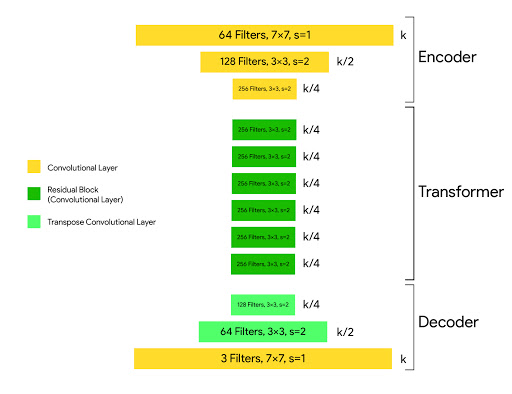

Discriminator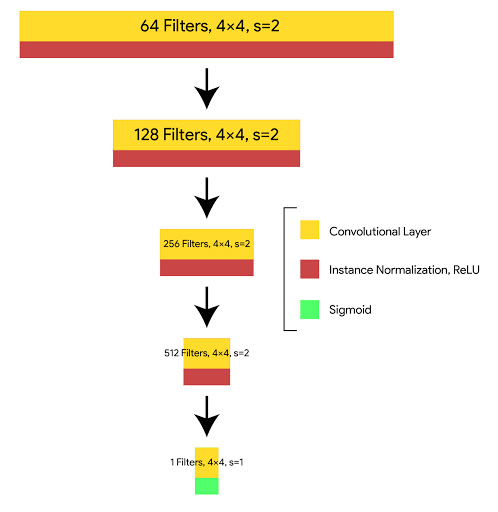

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.conv(x)

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            ConvBlock(channels, channels, kernel_size=3, padding=1),
            ConvBlock(channels, channels, use_act=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, img_channels, num_features = 64, num_residuals=9):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(img_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
        )
        self.down_blocks = nn.ModuleList(
            [
                ConvBlock(num_features, num_features*2, kernel_size=3, stride=2, padding=1),
                ConvBlock(num_features*2, num_features*4, kernel_size=3, stride=2, padding=1),
            ]
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(num_features*4) for _ in range(num_residuals)]
        )
        self.up_blocks = nn.ModuleList(
            [
                ConvBlock(num_features*4, num_features*2, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
                ConvBlock(num_features*2, num_features*1, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
            ]
        )

        self.last = nn.Conv2d(num_features*1, img_channels, kernel_size=7, stride=1, padding=3, padding_mode="reflect")

    def forward(self, x):
        x = self.initial(x)
        for layer in self.down_blocks:
            x = layer(x)
        x = self.res_blocks(x)
        for layer in self.up_blocks:
            x = layer(x)
        return torch.tanh(self.last(x))


class Block(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, stride, 1, bias=True, padding_mode="reflect"),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(
                in_channels,
                features[0],
                kernel_size=4,
                stride=2,
                padding=1,
                padding_mode="reflect",
            ),
            nn.LeakyReLU(0.2, inplace=True),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(Block(in_channels, feature, stride=1 if feature==features[-1] else 2))
            in_channels = feature
        layers.append(nn.Conv2d(in_channels, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect"))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = self.initial(x)
        return torch.sigmoid(self.model(x))

device cuda
..loading from  /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 99%|█████████▉| 331/334 [04:45<00:02,  1.16it/s]

1000
A->B


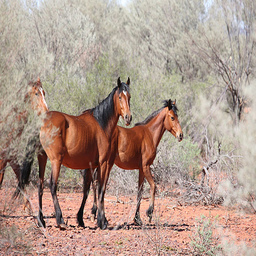

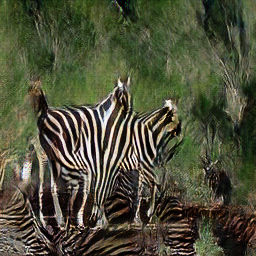

B->A


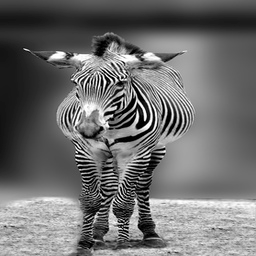

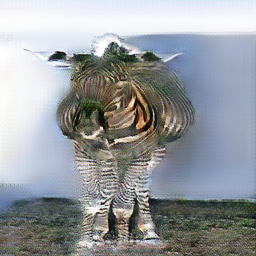

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 99%|█████████▊| 329/334 [04:43<00:04,  1.16it/s]

2000
A->B


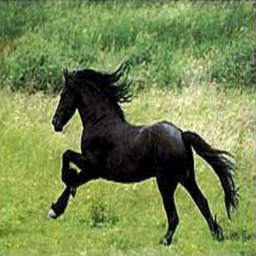

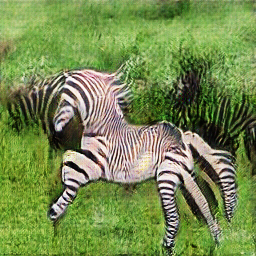

B->A


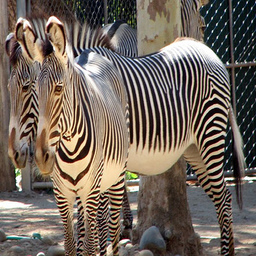

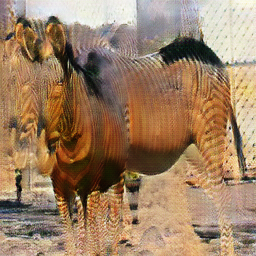

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 98%|█████████▊| 327/334 [04:42<00:06,  1.16it/s]

3000
A->B


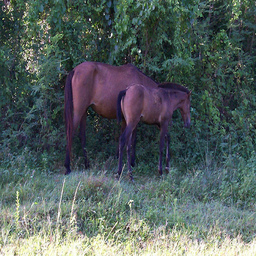

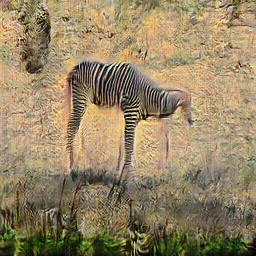

B->A


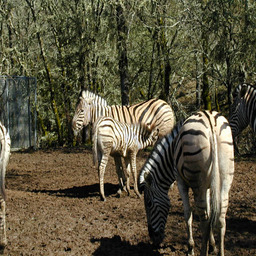

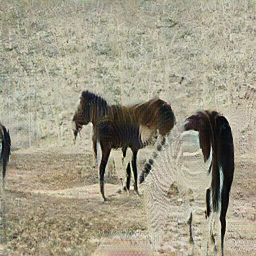

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 97%|█████████▋| 325/334 [04:40<00:07,  1.16it/s]

4000
A->B


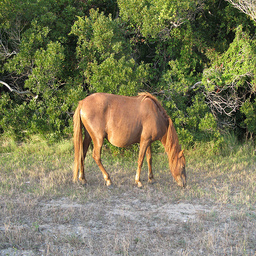

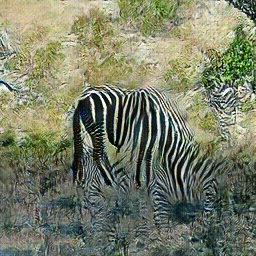

B->A


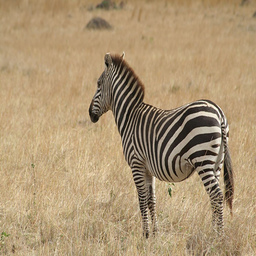

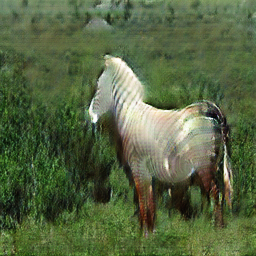

100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 97%|█████████▋| 323/334 [04:38<00:09,  1.16it/s]

5000
A->B


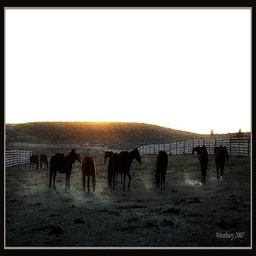

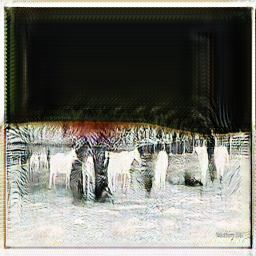

B->A


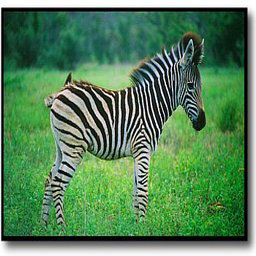

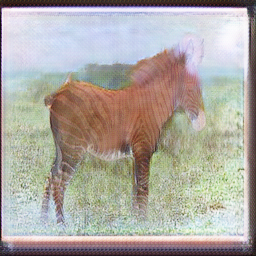

100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 96%|█████████▌| 321/334 [04:37<00:11,  1.16it/s]

6000
A->B


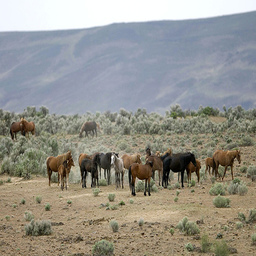

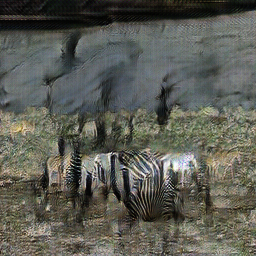

B->A


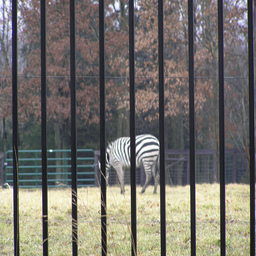

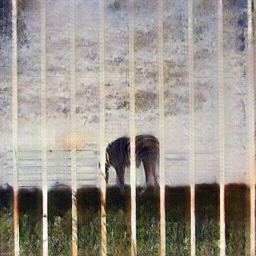

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 96%|█████████▌| 319/334 [04:35<00:12,  1.16it/s]

7000
A->B


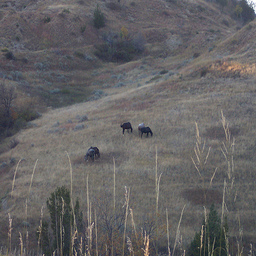

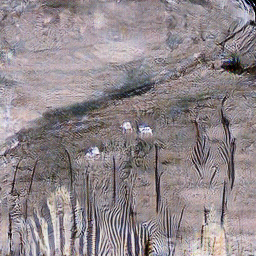

B->A


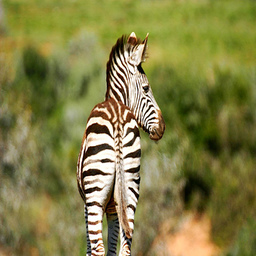

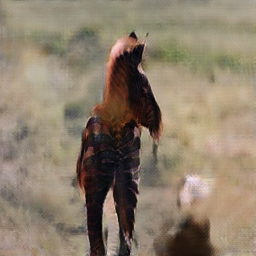

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 95%|█████████▍| 317/334 [04:33<00:14,  1.16it/s]

8000
A->B


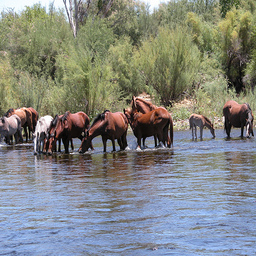

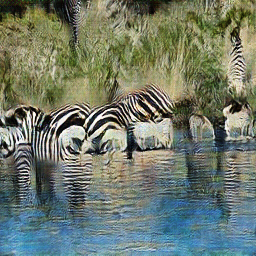

B->A


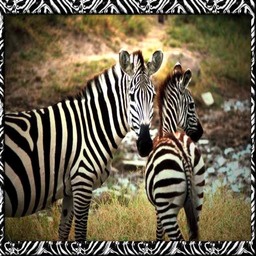

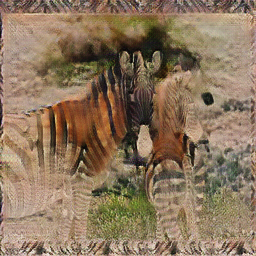

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 94%|█████████▍| 315/334 [04:32<00:16,  1.16it/s]

9000
A->B


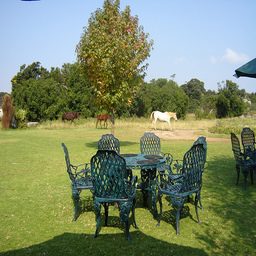

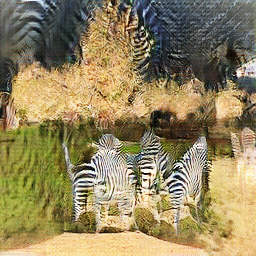

B->A


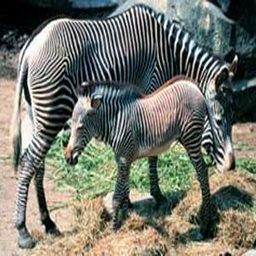

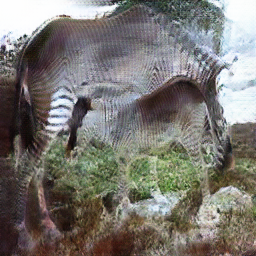

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 94%|█████████▎| 313/334 [04:30<00:18,  1.16it/s]

10000
A->B


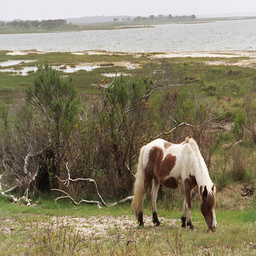

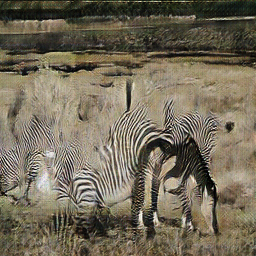

B->A


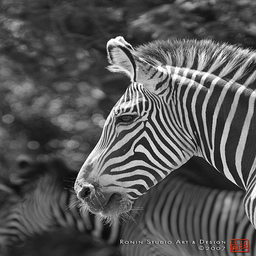

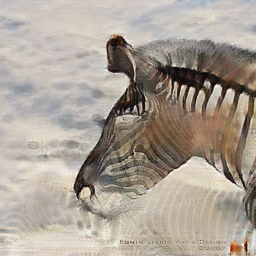

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 93%|█████████▎| 311/334 [04:28<00:19,  1.16it/s]

11000
A->B


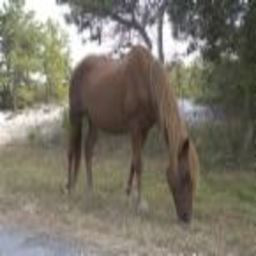

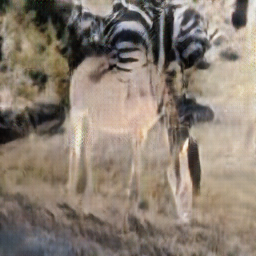

B->A


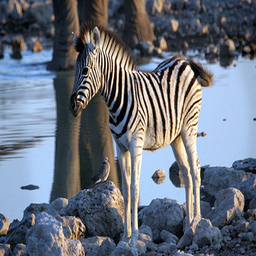

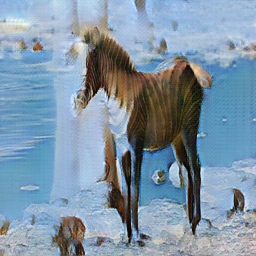

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 93%|█████████▎| 309/334 [04:26<00:21,  1.16it/s]

12000
A->B


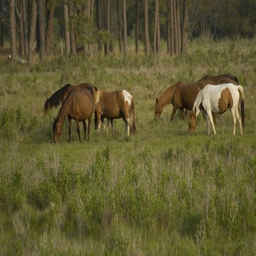

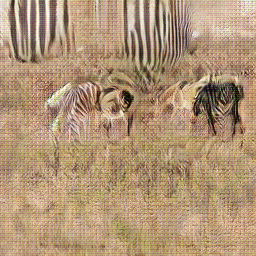

B->A


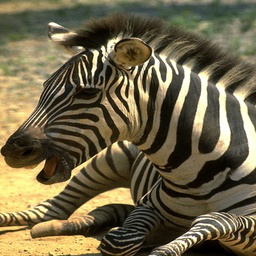

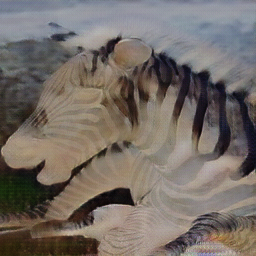

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 92%|█████████▏| 307/334 [04:25<00:23,  1.16it/s]

13000
A->B


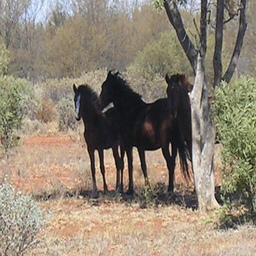

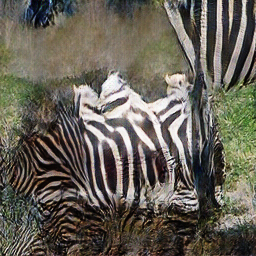

B->A


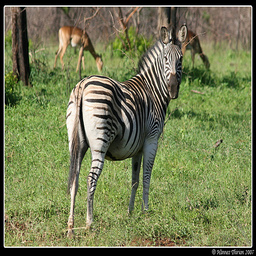

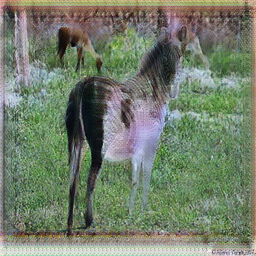

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:47<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 91%|█████████▏| 305/334 [04:23<00:24,  1.16it/s]

14000
A->B


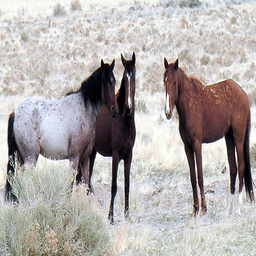

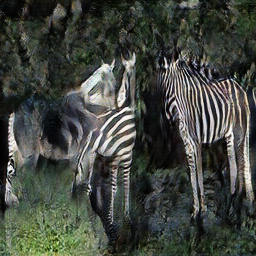

B->A


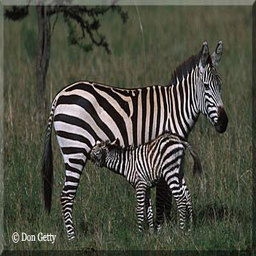

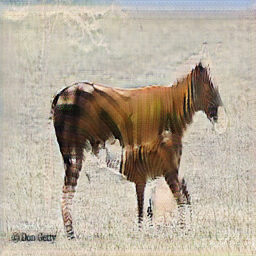

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 91%|█████████ | 303/334 [04:21<00:26,  1.16it/s]

15000
A->B


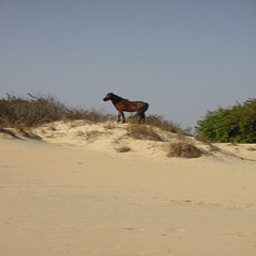

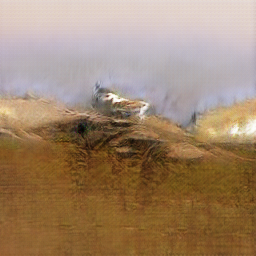

B->A


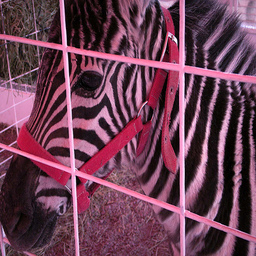

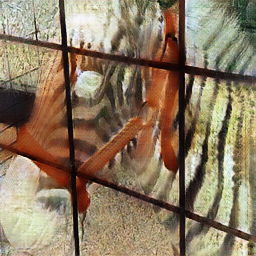

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 90%|█████████ | 301/334 [04:19<00:28,  1.16it/s]

16000
A->B


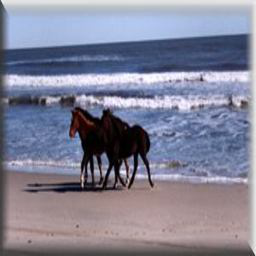

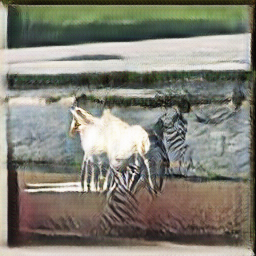

B->A


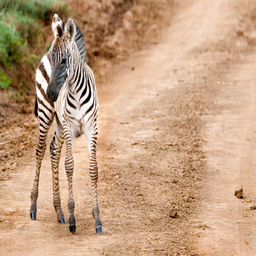

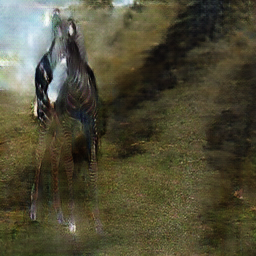

100%|██████████| 334/334 [04:48<00:00,  1.16it/s]


..saving at /gdrive/MyDrive/cycGAN'/horse2zebra/


 52%|█████▏    | 174/334 [02:30<02:18,  1.16it/s]

In [ ]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device', device)
#path ="/gdrive/MyDrive/cycGAN'/horse2zebra/"

disc_A = Discriminator(in_channels=3).to(device)
disc_B = Discriminator(in_channels=3).to(device)
gen_AB = Generator(img_channels=3, num_residuals=9).to(device)
gen_BA = Generator(img_channels=3, num_residuals=9).to(device)
#load_models(path,disc_A,disc_B,gen_AB,gen_BA)
disopt = optim.Adam(list(disc_A.parameters()) + list(disc_B.parameters()),lr=0.001,betas=(0.5, 0.999))
genopt = optim.Adam(list(gen_AB.parameters()) + list(gen_BA.parameters()),lr=0.0003,betas=(0.5, 0.999))
train(dataloader,gen_AB,gen_BA,disc_A,disc_B,genopt,disopt,path,epochs=200,identity_loss=False)